In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import scipy.signal as signal
from sklearn.model_selection import StratifiedGroupKFold

from sklearn.metrics import confusion_matrix, accuracy_score

from mice_utils import get_split_info,get_labels_subjects

import pickle
import shap



Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [3]:
strains = ('BXD87', 'DBA2', 'C57B6')
tscs = ('Het', 'WT')
sources = ('Jax_Lab')
types = [strain+tsc for strain in strains for tsc in tscs ]
n_types = len(types)


mice_df = pd.read_pickle('meta-data/Jax_mice_with_splits_df.pickle')
nfolds,nsplits = get_split_info(mice_df)
print(nsplits,nfolds)


5 2


In [4]:
# Parameters for the segments used for testing
n_seg = 480 # Number of segements per class 
# Parameters for the dictionary 
window_length = 256*2 # 2s
n_centroids = 200
centroid_len = 256
#n_multiplier = 10
#n_windows = int(n_centroids*20*n_multiplier) 
n_windows = 100000
#n_windows = 40000
str_si = 'sv_sph_svd'
#str_si = 'sv'

#pool_str = 'pooled'
pool_str = ''
use_spectral = False
#use_spectral = True

if use_spectral:
    dict_param_string = 'spectral_'+str(n_windows)+'_'+str(window_length)+'_'+str(n_centroids)
else:
    dict_param_string = str(n_windows)+'_'+str(window_length)+'_'+str(n_centroids)+'_'+str(centroid_len)+'_'+str_si

In [5]:
def plot_confusion_matrix(y,y_pred,labels,title,fname,cmap="Blues"):
    conf_matrix = confusion_matrix(y, y_pred)
    micro_acc = np.trace(conf_matrix)/np.sum(conf_matrix)
    conf_matrix_norm = conf_matrix/ conf_matrix.sum(axis=1, keepdims=True)
#    macro_acc = np.mean(np.diag(conf_matrix_norm))
#    conf_matrix_norm *= 100
    cs= plt.matshow(conf_matrix_norm,cmap=cmap,vmin=0,vmax=1)#00)

    scale_colormaps = {'Blues':-0.5,"Grays":-0.5,"hot":0.4}
    for (i, j), z in np.ndenumerate(conf_matrix_norm):
        if z==0:
            continue
        color = 'w'
        if np.sign(scale_colormaps[cmap])*z>scale_colormaps[cmap]:
            color = 'b'
        plt.text(j, i, '{:0.2f}'.format(z), ha='center', va='center',color=color)
    
    plt.colorbar(cs)
    plt.xticks(np.arange(len(labels)),labels=labels,rotation='vertical')
    plt.yticks(np.arange(len(labels)),labels=labels)
#    plt.title(f'Accuracy (%) {title}. Macro: {100*macro_acc:.0f}% Micro (n={len(y)}): {100*micro_acc:.0f}%')
    plt.title(f'Accuracy {title}: {micro_acc:.2f} (n={len(y)})')
#    plt.savefig('./figures/'+fname+'.eps', format='eps',bbox_inches='tight')
#    plt.savefig('./figures/'+fname+'.png', format='png',bbox_inches='tight')

In [6]:
LOO = True

In [7]:
from scipy.signal import hilbert

def plot_codebooks(codebook,spectra,freq, name,titles=None, ncols=None,figsize=(9.5, 12),units='µ'):
    n = codebook.shape[0]
    if ncols is None:
        if n>8:
            ncols = 8
        else:
            ncols = int(n/2)
    nrows = int(np.ceil(n/ncols))
    if units == None:
        unit_multiplier = 1
        ylabel_units = 'A.U.'
    elif units == 'µ' or units =='µV':
        unit_multiplier = 1e6
        ylabel_units = 'µV'
    else:
        raise NotImplementedError
    fig, axs = plt.subplots(nrows, ncols*2, figsize=figsize)
    for i in range(nrows):
        for j in range(ncols):
            if i*ncols+j < n: # time points are 0 to 1 second. Length*Ts=length/fs
                tt= np.linspace(0,len(codebook[i * ncols + j])/(freq[-1]*2),len(codebook[i * ncols + j]))
                axs[i, j*2].axhline(ls=':')
                axs[i, j*2].plot(tt,unit_multiplier*codebook[i * ncols + j])#/np.linalg.norm(codebook[i * ncols + j]))
#                axs[i, j*2].plot(tt,np.abs(hilbert(codebook[i * ncols + j]))[:,np.newaxis]*np.array([1,-1])[np.newaxis,:],':b',alpha=0.2)
                axs[i, j*2].set_ylabel(f'Amplitude ({ylabel_units})')
                if titles is not None:
                    axs[i,j*2].set_title(titles[0][i*ncols+j])        
                axs[i, j*2+1].plot(freq,spectra[i * ncols + j])
                axs[i, j*2+1].set_xticks(np.arange(0,24,1.5))
                axs[i, j*2+1].set_xlim([0,18])
                axs[i, j*2+1].set_ylabel('normalized density')
                if titles is not None:
                    axs[i,j*2+1].set_title(titles[1][i*ncols+j])        
                if i==nrows-1:
                    axs[i, j*2].set_xlabel('time (s)')
                    axs[i, j*2+1].set_xlabel('freq (Hz)')
                    
                
#            axs[i, j*2].axis('off')  # hide axis
    
    plt.suptitle(name, fontsize=16)
    plt.tight_layout()
    plt.show()
    return fig, axs

In [8]:
def plot_spectra(weights_to_plot,spectra,freq,names,title,figsize=(3, 12),ylims=[-0.05,0.21]):
    fig, axs = plt.subplots(nrows=len(names), ncols=1, figsize=figsize)
    for i,name in enumerate(names):
        for j,spectrum in reversed(list(enumerate(spectra[i]))):
            axs[i].plot(freq,spectrum,color='C0' if j<5 else 'k')#,lw=weights_to_plot[i][j])
        axs[i].set_xticks(np.arange(0,24,1.5))
        axs[i].set_xlim([0,18])
        axs[i].set_ylim(ylims)
        axs[i].set_ylabel('normalized\n density')
        axs[i].set_xlabel('freq (Hz)')
         
        axs[i].set_title(name)
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()
    return fig, axs

In [9]:
colors_edge = np.array([[1,0,0],[0,0,0]])


models/classifiers_l2_48000100000_512_200_256_sv_sph_svdtsc_on_strainLOO
0 16
1 17
2 9
3 10
4 5
5 7
6 8
7 12
8 13
9 14
10 15
11 11
12 19
13 20
14 6
15 21
16 22
17 0
18 1
19 2
20 3
21 4
22 18
./figures/coef_DBA2Het_vs_DBA2WT48000100000_512_200_256_sv_sph_svd.pdf
./figures/freq_DBA2Het_vs_DBA2WT48000100000_512_200_256_sv_sph_svd.pdf


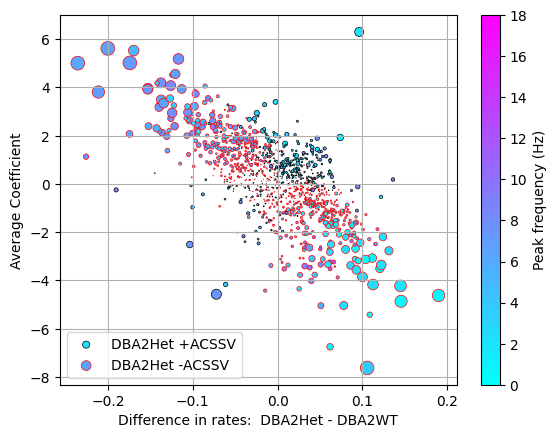

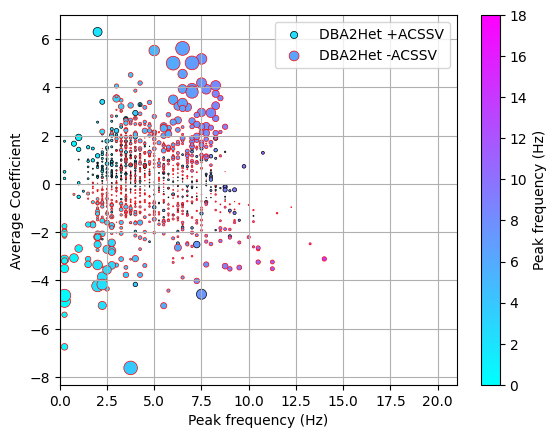

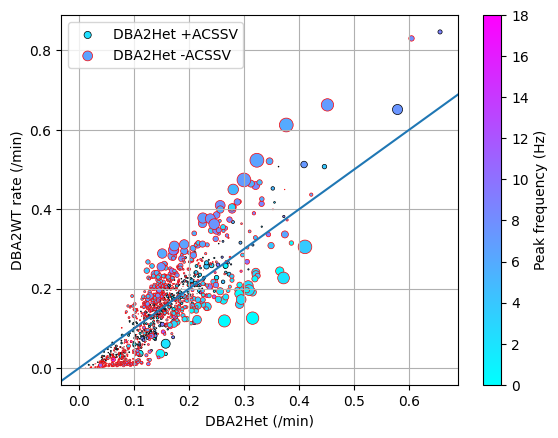

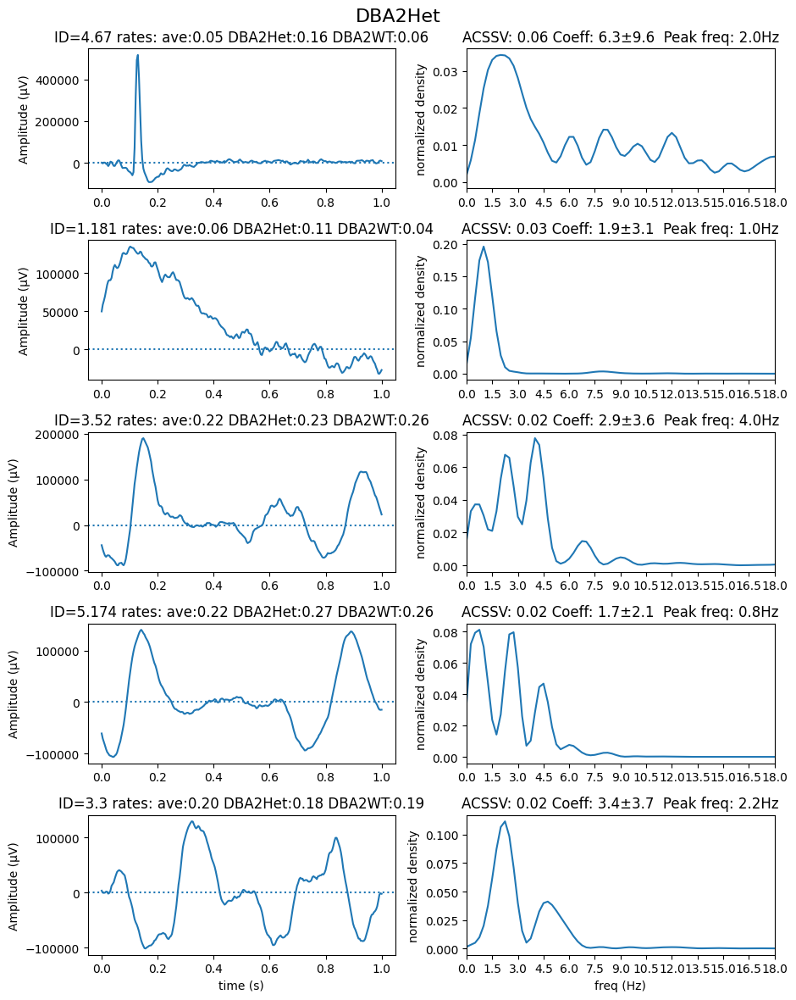

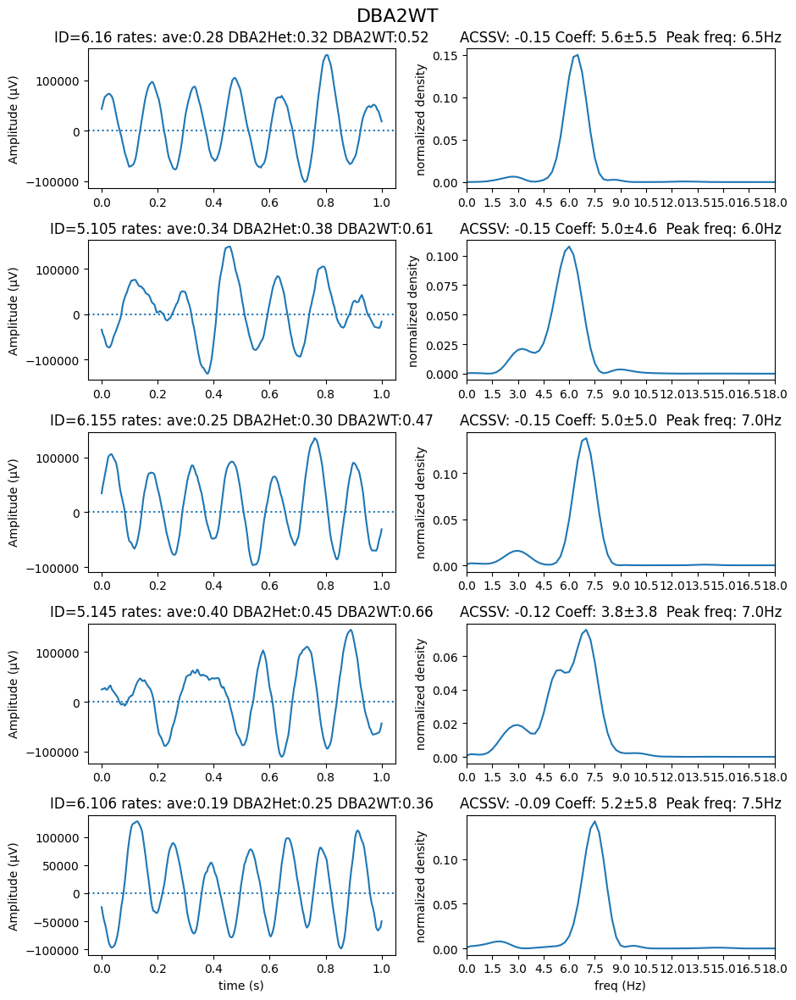

./figures/coef_C57B6Het_vs_C57B6WT48000100000_512_200_256_sv_sph_svd.pdf
./figures/freq_C57B6Het_vs_C57B6WT48000100000_512_200_256_sv_sph_svd.pdf


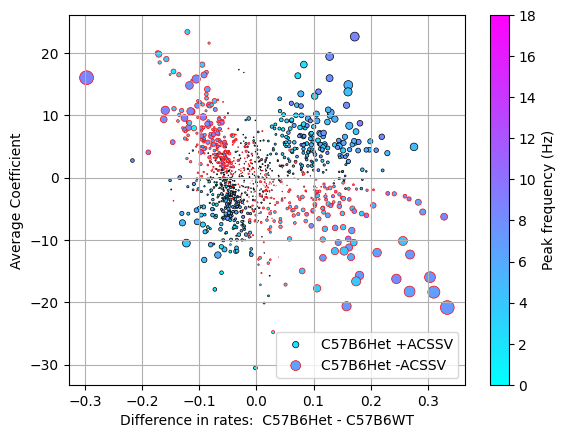

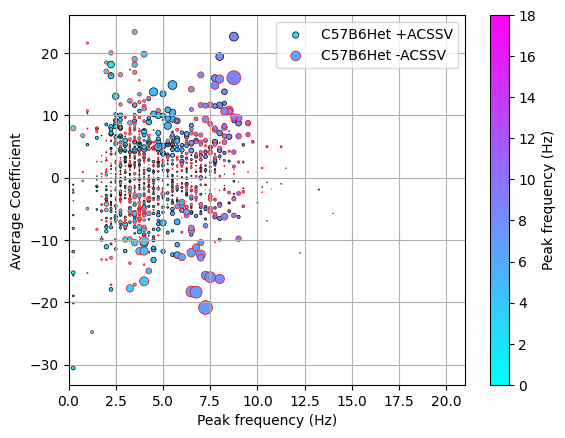

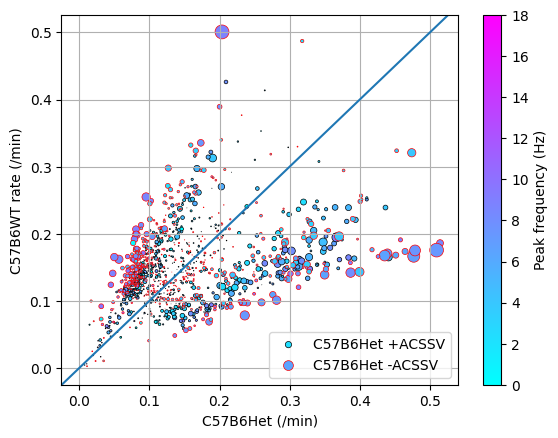

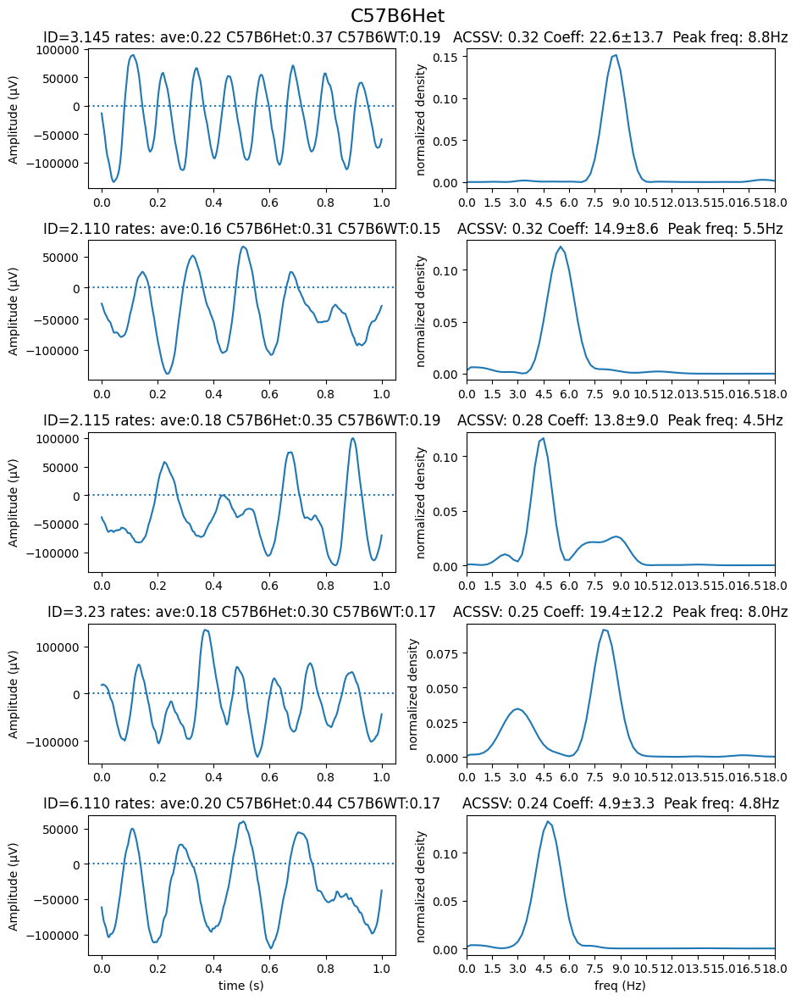

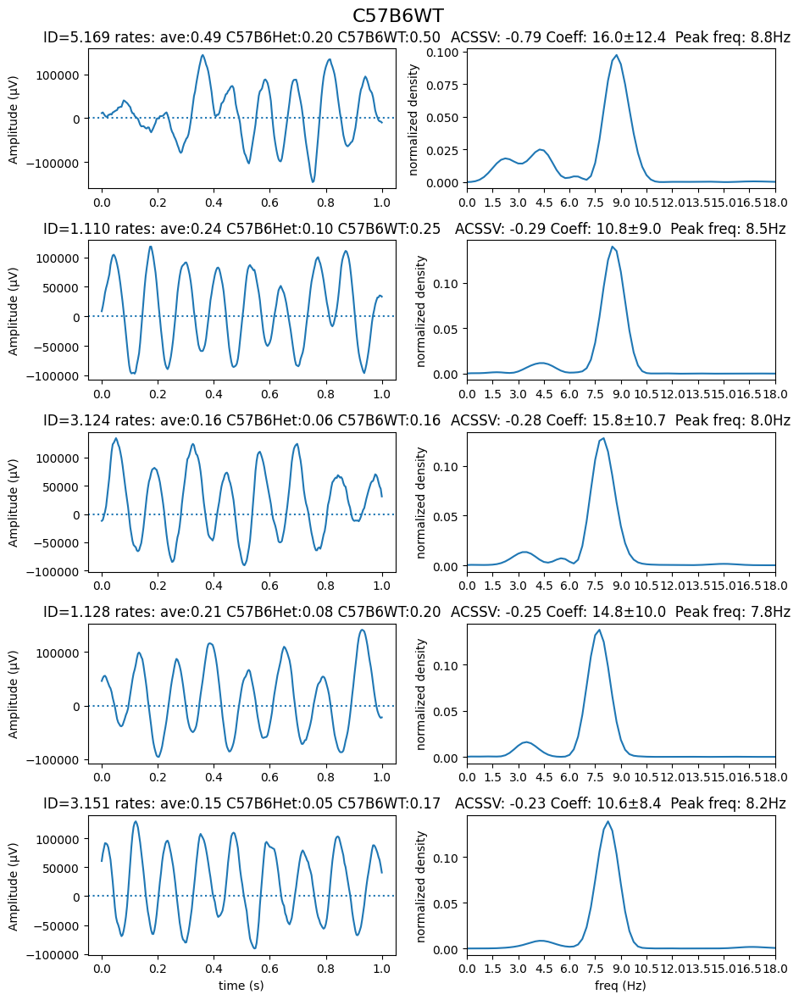

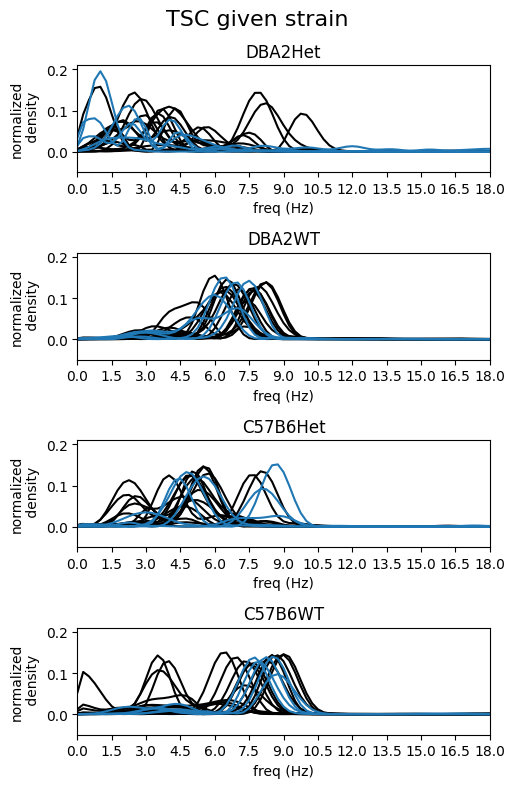

models/classifiers_l2_48001100000_512_200_256_sv_sph_svdtsc_on_strainLOO
0 15
1 16
2 17
3 8
4 9
5 10
6 5
7 6
8 11
9 7
10 12
11 13
12 14
13 18
14 19
15 20
16 21
17 0
18 1
19 2
20 3
21 4
./figures/coef_DBA2Het_vs_DBA2WT48001100000_512_200_256_sv_sph_svd.pdf
./figures/freq_DBA2Het_vs_DBA2WT48001100000_512_200_256_sv_sph_svd.pdf


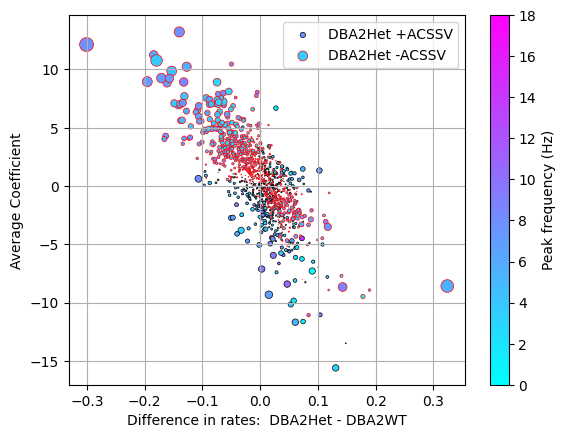

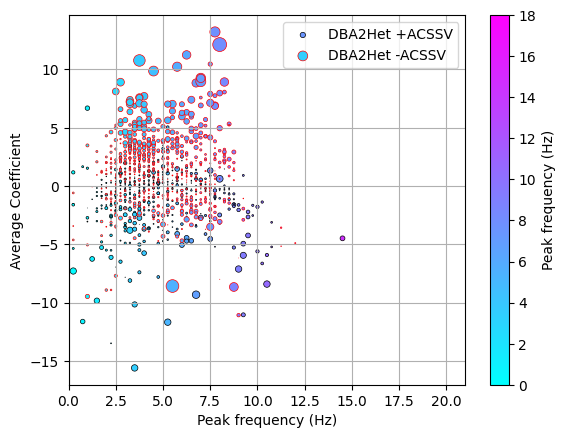

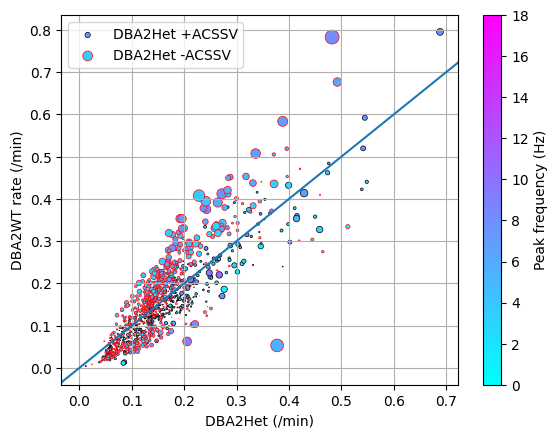

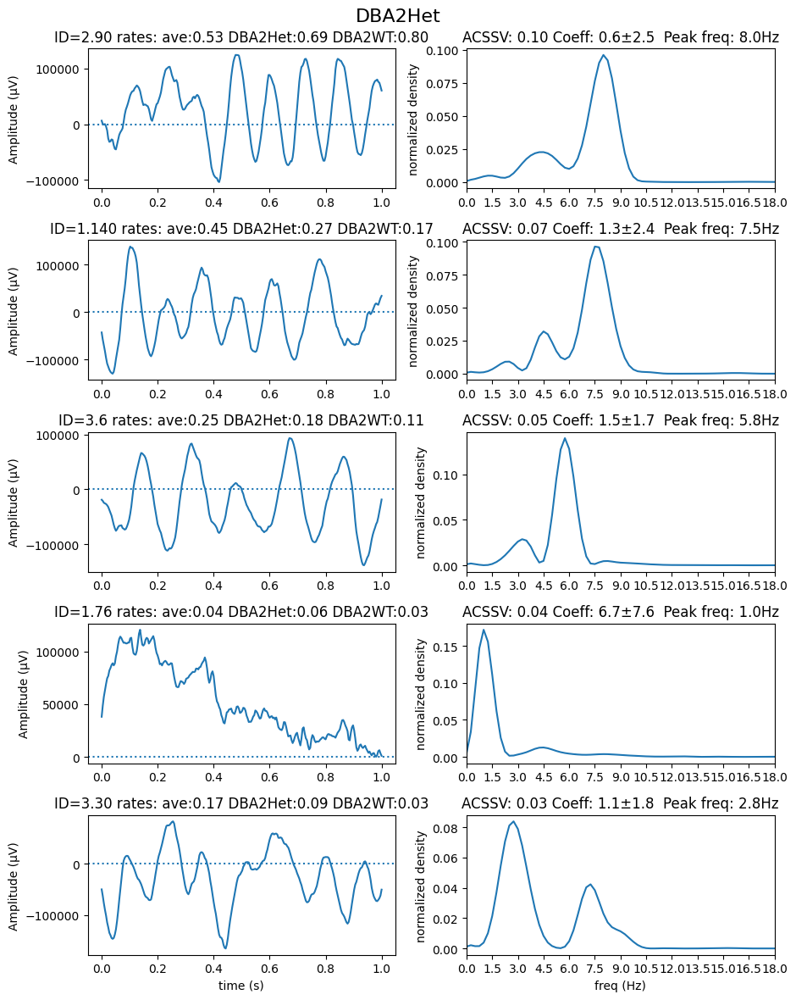

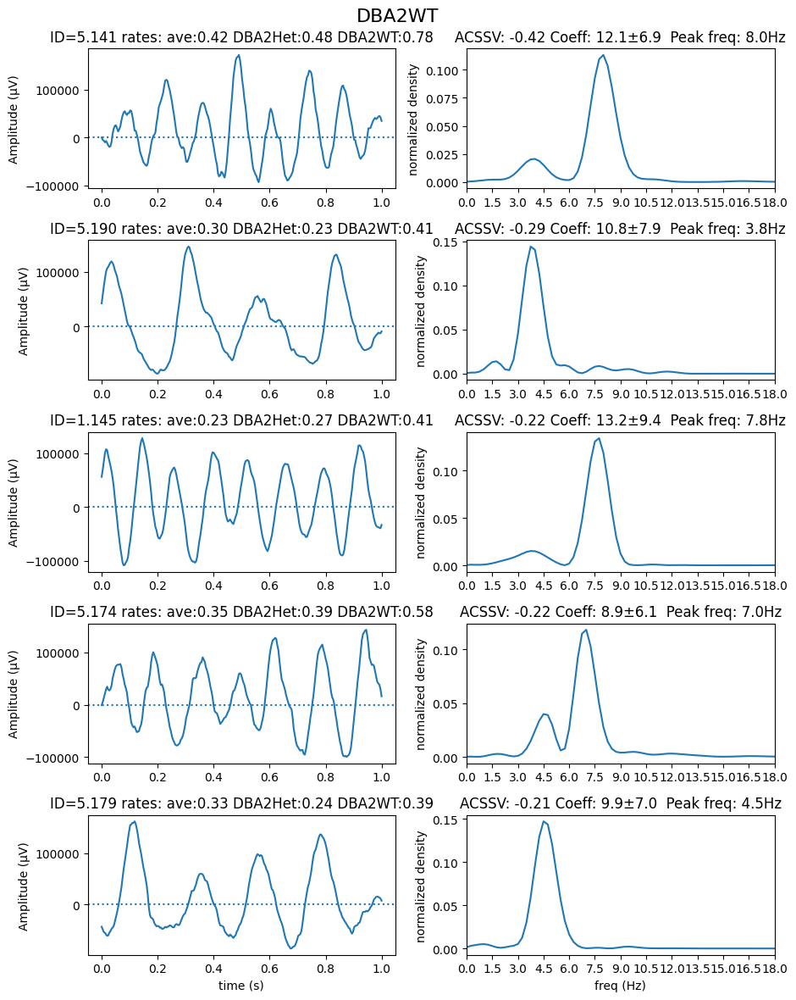

./figures/coef_C57B6Het_vs_C57B6WT48001100000_512_200_256_sv_sph_svd.pdf
./figures/freq_C57B6Het_vs_C57B6WT48001100000_512_200_256_sv_sph_svd.pdf


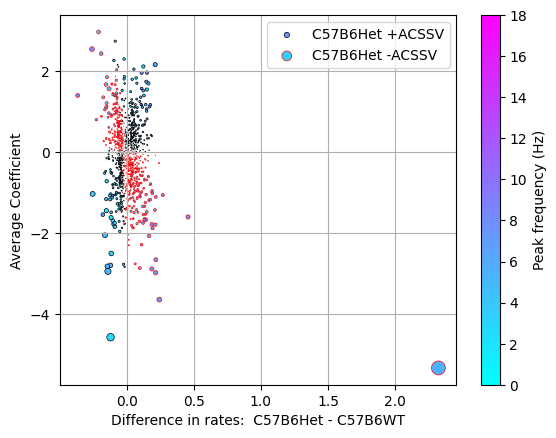

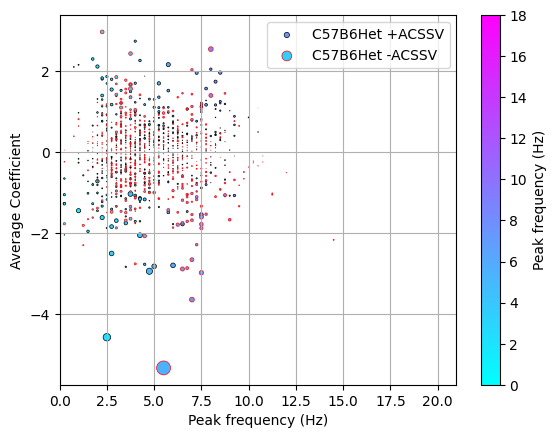

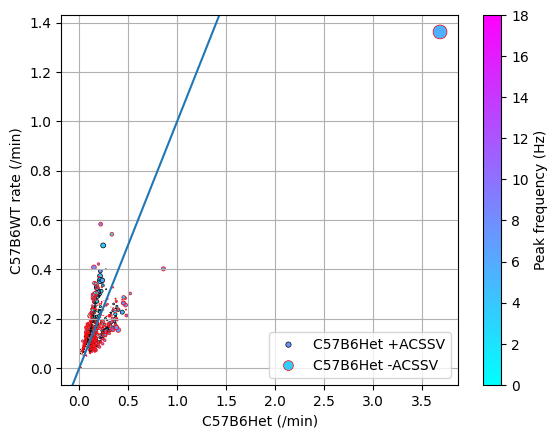

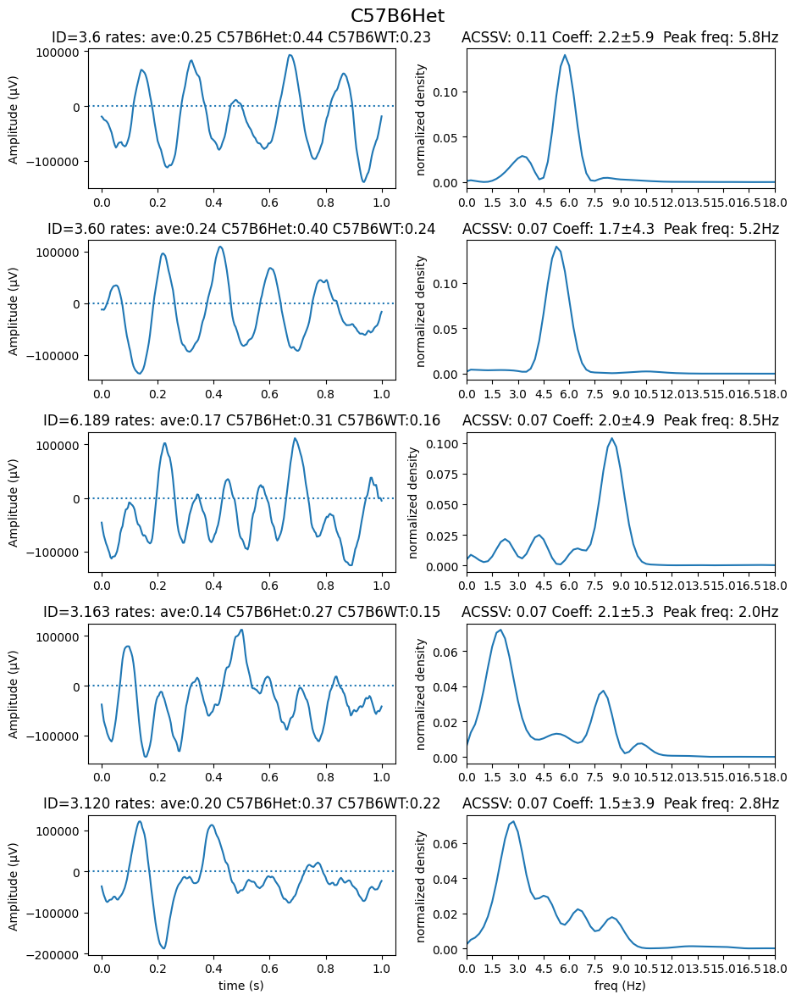

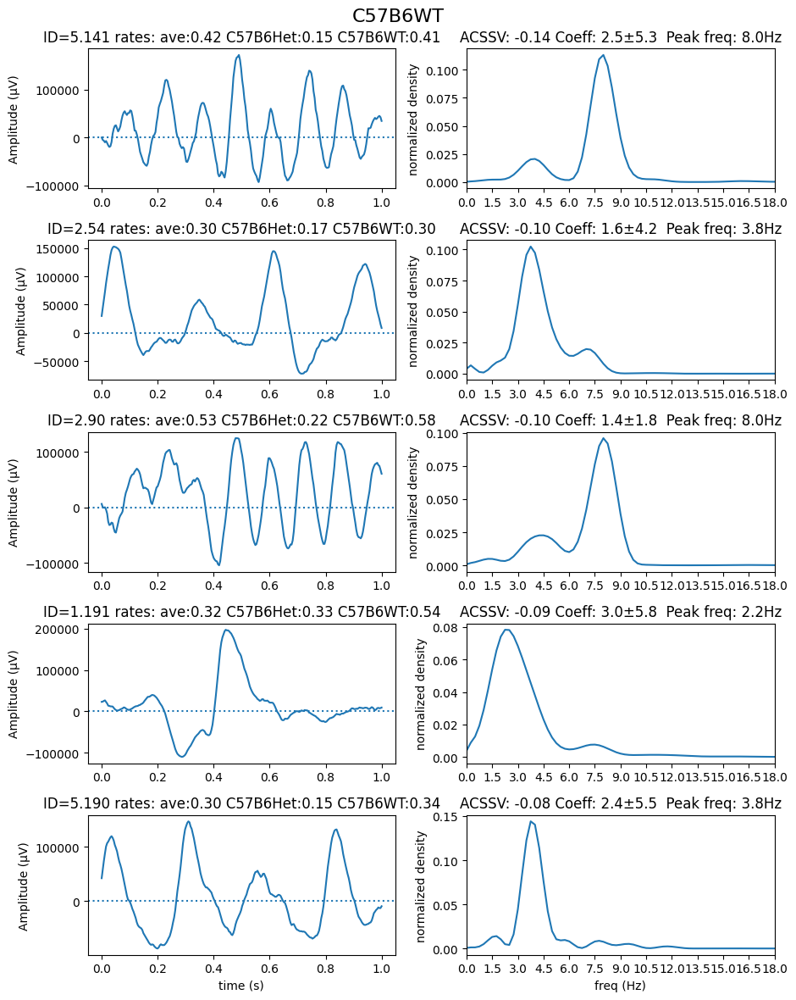

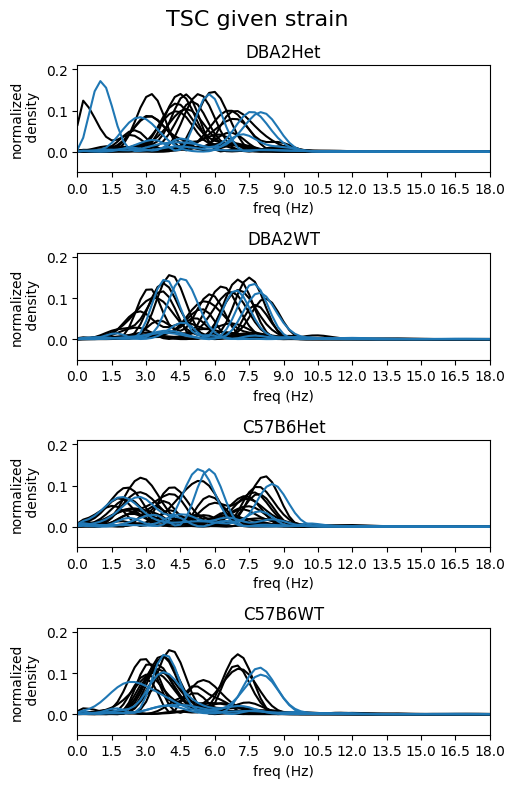

In [11]:
toplot12=4
toplot=5
n_spectra = 20
max_freq =18


for task_str in ['tsc_on_strain']:#,'strain_on_tsc']:#,'tsc_on_strain']:    
    for split in range(1):#range(nsplits):
        for test_fold in range(nfolds):
            segment_param_string = str(n_seg)+'_'+str(split)+str(test_fold)+dict_param_string        
            segment_info_test = pickle.load(open( "data/hpc_segment_info_test_"+segment_param_string+".pickle", "rb" ) )
            segment_info_train = pickle.load(open( "data/hpc_segment_info_valid_"+segment_param_string+".pickle", "rb" ) )
            count_param_string = str(n_seg)+str(split)+str(test_fold)+dict_param_string
            
            all_counts = pickle.load(open( "data/hpc_count_valid_"+count_param_string+".pickle", "rb" ) )
            counts_test = pickle.load(open( "data/hpc_count_test_"+count_param_string+".pickle", "rb" ) )
            label_train,subject_train,subject_index2name = get_labels_subjects(segment_info_train)
            label_test, subject_test, subject_index2name_test = get_labels_subjects(segment_info_test)        

            subs_in_test, outer_indices = np.unique(subject_test,return_index=True)
            y_test_pooled = label_test[outer_indices].copy()       
        
            if task_str =='strain_on_tsc':
                given_test = label_test %  2                
                cond_test = label_test // 2
                given_train = label_train %  2                
                cond_train = label_train // 2

                label_offset = label_test % 2
                label_offset_pooled = y_test_pooled % 2
                def label_remap(v):
                    return v*2
                set_of_given = np.arange(2)
            elif task_str =='tsc_on_strain':
                given_test = label_test //  2
                cond_test = label_test % 2 
                given_train = label_train //  2
                cond_train = label_train % 2                
                
                label_inv_map = given_test*2
                label_offset = (label_test // 2)*2
                label_offset_pooled = (y_test_pooled//2 )*2
                def label_remap(v):
                    return v
                set_of_given = np.arange(3)
            else:
                print('unknown conditional task')
                
            given_test_pooled = given_test[outer_indices].copy()        
            
            results = np.zeros((y_test_pooled.shape[0],1200,6)) # Shapely 
            all_coefs = np.zeros((y_test_pooled.shape[0],1200,6)) 
            
            cond_test_pooled = cond_test[outer_indices]        
            X_test = np.hstack( [ np.vstack( [counts_test[d,s] for s in segment_info_test ] ) for d in segment_info_test])    
            X_train = np.hstack( [ np.vstack( [all_counts[d,s] for s in segment_info_train ] ) for d in segment_info_train])         
            
            if LOO:
                n_groups = len(np.unique(subject_test))
            else:
                n_groups = 5

            group_kfold_test = StratifiedGroupKFold(n_splits=n_groups)
            # Load classifier
            filename = 'models/classifiers_l2_'+count_param_string+task_str+ 'LOO' if LOO else ''
            
            print(filename)
            pipes = pickle.load(open(filename+".pkl", "rb")) 

            for k, (train_index, test_index) in enumerate(group_kfold_test.split(X_test, label_test, subject_test)):    
#                print([(i,j) for i,j in zip(orig_label[test_index],given_test[test_index])])
                given_labels = given_test[test_index]                
                for given_label in set_of_given:
                    pipe_i = pipes[k][given_label]
                    if X_test[test_index[given_labels==given_label]].shape[0]==0:
                        continue
                    X_train_k = np.vstack((X_train[given_train==given_label], X_test[train_index[given_test[train_index]==given_label]] ))
                    test_train_groups = subject_test[train_index[given_test[train_index]==given_label]]
                    train_k_groups = np.concatenate((subject_train[given_train==given_label],test_train_groups))
                    
                    subs_in_train, indices,inverses = np.unique(train_k_groups,return_index=True, return_inverse=True)
                   # pooling counts per mouse 
                    X_train_k_pooled = np.zeros(X_train_k[indices].shape)#.copy()#.todense()
                    for l,index in enumerate(indices):
                        X_train_k_pooled[l] = np.mean(X_train_k[inverses==l],axis=0)
                    
                    X_test_k = X_test[test_index[given_labels==given_label]]                    
                    test_groups = subject_test[test_index[given_labels==given_label]]
                    subs_in_test_k, indices,inverses = np.unique(test_groups,return_index=True, return_inverse=True)
                    print(k,subs_in_test_k[0])
                    X_test_k_pooled = np.zeros(X_test_k[indices].shape)
                    for l,index in enumerate(indices):
                        X_test_k_pooled[l] = np.mean(X_test_k[inverses==l],axis=0)

                    tf_method = lambda x: pipe_i.named_steps['tfidf'].transform(x)
                    explainer = shap.Explainer(pipe_i.named_steps['clf'], tf_method(X_train_k_pooled))
                    shap_values = explainer(tf_method(X_test_k_pooled))
                    if len(np.unique(cond_train))==2:
                        results[np.isin(subs_in_test,subs_in_test_k),:,given_label*2:given_label*2+2] = (
                            shap_values.values)[:,:,np.newaxis]*np.array([1,-1]).reshape((1,1,2))
                        all_coefs[np.isin(subs_in_test,subs_in_test_k),:,given_label*2:given_label*2+2] = (
                            pipe_i.named_steps['clf'].coef_)[:,:,np.newaxis]*np.array([1,-1]).reshape((1,1,2))
                        

            
            dict_filename = "models/centroids_" + str(split) + str(test_fold) + '_' + dict_param_string + ".pickle"
            waveform_dict = pickle.load(open(dict_filename, "rb"))
            waveforms = np.vstack( [waveform_dict[d]  for d in segment_info_train])   
        
            peaks = np.zeros(waveforms.shape[0])
            nfft = 1024#2048
            n = len(waveforms[0])
            freq,spectrum = signal.welch(waveforms[0],fs=mice_df['sfreq'].iloc[0],nfft=nfft,nperseg=int(.95*n),noverlap=int(.9*n))
        
            spectra = np.zeros((waveforms.shape[0],len(freq)))        
            for i in range(waveforms.shape[0]):
                y = waveforms[i]#/np.linalg.norm(waveforms[i])
                n = len(y)
                freq,spectra[i] = signal.welch(y,fs=mice_df['sfreq'].iloc[0],nfft=nfft,nperseg=int(.95*n),noverlap=int(.9*n))
                peaks[i]= freq[np.argmax(spectra[i])]

            nspectra = spectra/np.sum(spectra,axis=1,keepdims=True)

            if task_str =='tsc_on_strain':            
                classes_to_plot = [2,4]
                c_inc_func = lambda c: c+1 if c%2==0 else c-1 
            names_to_plot = []
            spectra_to_plot = []
            weights_to_plot = []
            for c in classes_to_plot:
                c_inc = c_inc_func(c)                         

                ave_shap_cont = (np.sum(results[y_test_pooled==c ,:,c],axis=0)
                                 -np.sum(results[y_test_pooled==c_inc ,:,c],axis=0)).squeeze()/np.sum((y_test_pooled==c)|(y_test_pooled==c_inc))


                ave_coef = (np.sum(all_coefs[y_test_pooled==c ,:,c],axis=0)
                                 +np.sum(all_coefs[y_test_pooled==c_inc ,:,c],axis=0)).squeeze()/np.sum((y_test_pooled==c)|(y_test_pooled==c_inc))

                std_coef =np.sqrt((np.sum((all_coefs[y_test_pooled==c ,:,c]-ave_coef[np.newaxis,:])**2,axis=0)
                                 +np.sum((all_coefs[y_test_pooled==c_inc ,:,c]-ave_coef[np.newaxis,:])**2,axis=0)).squeeze()/(-1+np.sum((y_test_pooled==c)|(y_test_pooled==c_inc))))

                
                ave_occurence_rate = np.mean(np.vstack([X_train,X_test]),axis=0)/60 # per minute
                in_occurence_rate = np.mean(np.vstack([X_train[label_train==c],X_test[label_test==c]]),axis=0)/60 # per minute
                out_occurence_rate = np.mean(np.vstack([X_train[label_train==c_inc],X_test[label_test==c_inc]]),axis=0)/60 # per minute
                
                shap_size = 100*np.abs(ave_shap_cont)/np.max(np.abs(ave_shap_cont))

                neg = ave_shap_cont<0
                pos = ave_shap_cont>0
                fig = plt.figure()      
                plt.scatter(in_occurence_rate[pos]-out_occurence_rate[pos], ave_coef[pos],shap_size[pos],peaks[pos],vmin=0,vmax=max_freq,edgecolors=colors_edge[(ave_shap_cont>0).astype(int)][pos],
                            label=types[c]+' +ACSSV',cmap='cool',lw=0.5)
                plt.scatter(in_occurence_rate[neg]-out_occurence_rate[neg], ave_coef[neg],shap_size[neg],peaks[neg],vmin=0,vmax=max_freq,edgecolors=colors_edge[(ave_shap_cont>0).astype(int)][neg],
                            label=types[c]+' -ACSSV',cmap='cool',lw=0.5)
               
                plt.legend()
                plt.xlabel('Difference in rates:  {} - {}'.format(
                        types[c],
                        types[c_inc]))                          
                plt.ylabel('Average Coefficient')
                plt.grid(visible=True,which='both',axis='both')
                plt.colorbar(label='Peak frequency (Hz)')
                this_filename = './figures/'+'coef_'+types[c]+'_vs_'+types[c_inc]+count_param_string+'.pdf'
                print(this_filename)
                plt.savefig(this_filename)

                
#            ave_shap_cont
                fig = plt.figure()      
                plt.scatter(peaks[pos], ave_coef[pos],shap_size[pos],peaks[pos],vmin=0,vmax=max_freq,edgecolors=colors_edge[(ave_shap_cont>0).astype(int)][pos],
                            label=types[c]+' +ACSSV',cmap='cool',lw=0.5)
                plt.scatter(peaks[neg], ave_coef[neg],shap_size[neg],peaks[neg],vmin=0,vmax=max_freq,edgecolors=colors_edge[(ave_shap_cont>0).astype(int)][neg],
                            label=types[c]+' -ACSSV',cmap='cool',lw=0.5)
               
                plt.legend()
                plt.xlim(0,21)
                plt.grid(visible=True,which='both',axis='both')
                plt.xlabel('Peak frequency (Hz)')
#                plt.ylabel('Average class-signed Shapely value')
                plt.ylabel('Average Coefficient')                
                plt.colorbar(label='Peak frequency (Hz)')
                this_filename = './figures/'+'freq_'+types[c]+'_vs_'+types[c_inc]+count_param_string+'.pdf'
                print(this_filename)
                plt.savefig(this_filename)
                

                fig = plt.figure() 
                
                plt.axline((0,0),slope=1)
                plt.scatter(in_occurence_rate[pos],out_occurence_rate[pos], 
                            shap_size[pos],peaks[pos],edgecolors=colors_edge[(ave_shap_cont>0).astype(int)][pos],
                            label=types[c]+' +ACSSV',cmap='cool',lw=0.5,vmin=0,vmax=max_freq)
                plt.scatter(in_occurence_rate[neg],out_occurence_rate[neg], 
                            shap_size[neg],peaks[neg],edgecolors=colors_edge[(ave_shap_cont>0).astype(int)][neg],
                            label=types[c]+' -ACSSV',cmap='cool',lw=0.5,vmin=0,vmax=max_freq)
                plt.grid(visible=True,which='both',axis='both')
                plt.legend()
                plt.colorbar(label='Peak frequency (Hz)')
                plt.xlabel(types[c]+' (/min)')
                plt.ylabel(types[c_inc]+' rate (/min)')
                plt.savefig('./figures/'+'rates_'+types[c]+'_vs_'+types[c_inc]+count_param_string+'.pdf')


                for do_twice in [-1,1]:

                    values = do_twice*ave_shap_cont
                    values[ave_coef<0] = np.inf 
                    wave_idx = np.argsort(values)

                    wave_str = ['ID={}.{} rates: ave:{:.2f} {}:{:.2f} {}:{:.2f}'.format(
                        (i//200)+1,(i%200)+1,
                        ave_occurence_rate[i],
                        types[c],
                        in_occurence_rate[i],
                        types[c_inc],
                        out_occurence_rate[i]) for i,p in zip(wave_idx,peaks[wave_idx])]
                    peak_str = ['ACSSV: {:0.2f} Coeff: {:0.1f}±{:0.1f}  Peak freq: {:0.1f}Hz'.format(
                        ap,a,s,p) 
                                for i,ap,a,s,p in zip(wave_idx,ave_shap_cont[wave_idx],
                                                         ave_coef[wave_idx],std_coef[wave_idx],peaks[wave_idx])]
                    fig,ax = plot_codebooks(waveforms[wave_idx[:toplot]],nspectra[wave_idx[:toplot]],freq,types[c_inc_func(c+(do_twice<0))],titles=(wave_str,peak_str),ncols=1)
                    fig.savefig('./figures/'+'waves_'+types[c_inc_func(c+(do_twice<0))]+count_param_string+'.pdf')
                for do_twice in [-1,1]:
                    values = do_twice*ave_shap_cont
                    values[ave_coef<0] = np.inf 
                    wave_idx = np.argsort(values)
                    names_to_plot.append(types[c_inc_func(c+(do_twice<0))])
                    spectra_to_plot.append(nspectra[wave_idx[:n_spectra]])            
                    weights_to_plot.append(8*np.abs(ave_shap_cont[wave_idx[:n_spectra]]))#ave_shap_cont            
     
            fig,ax = plot_spectra(weights_to_plot,spectra_to_plot,freq,names_to_plot,title='TSC given strain',figsize=(5.25, 8))
            fig.savefig('./figures/'+'spectra_'+'tsc_given_strain_'+count_param_string+'.pdf')
    


models/classifiers_l2_48000100000_512_200_256_sv_sph_svdstrainLOO


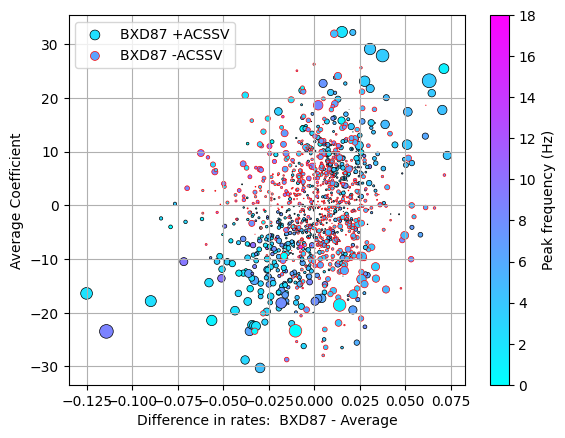

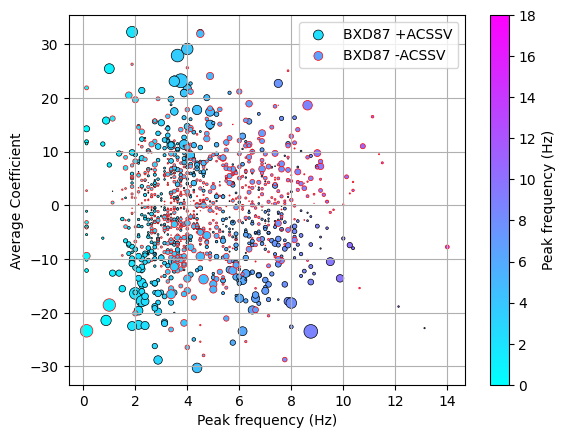

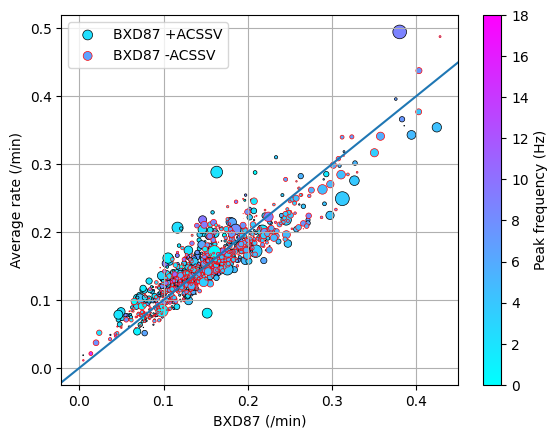

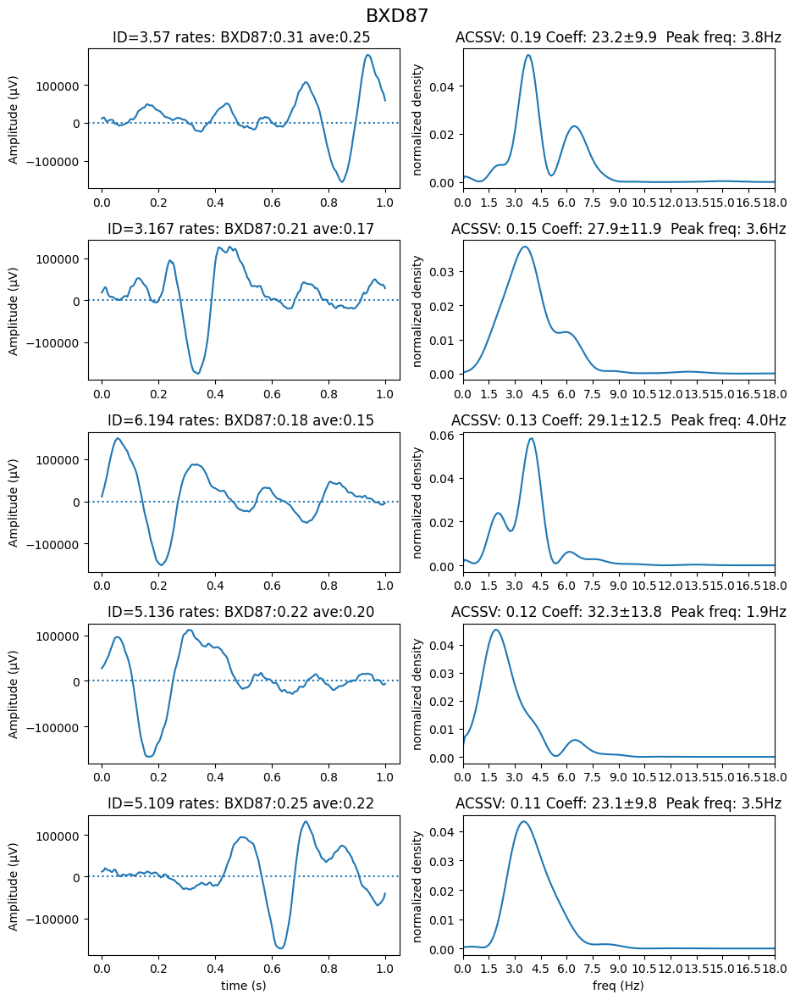

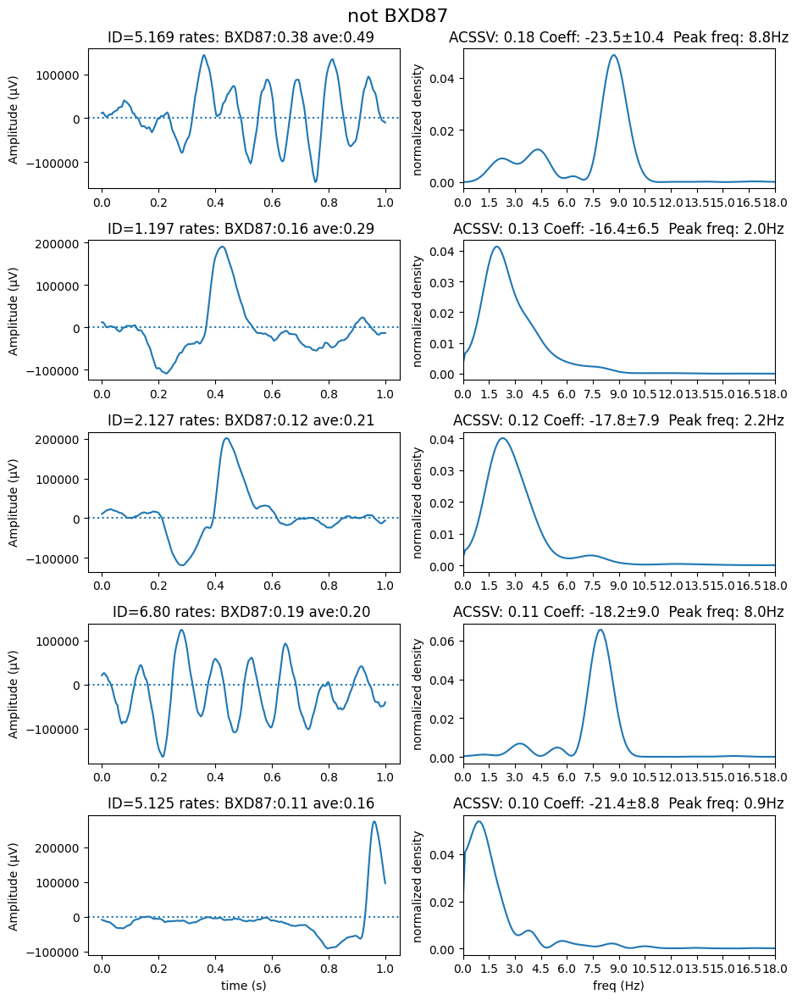

...

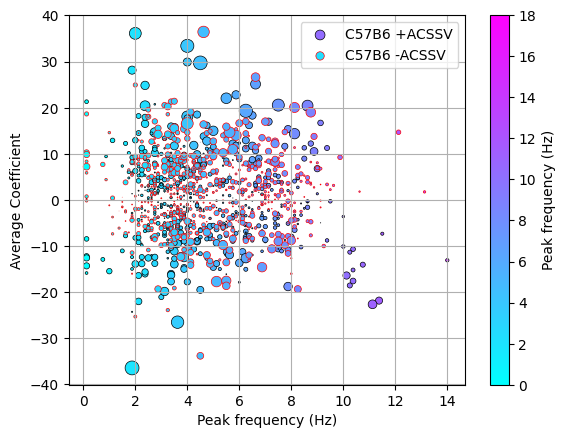

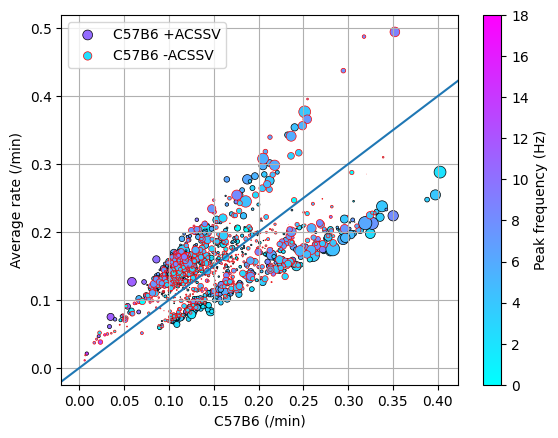

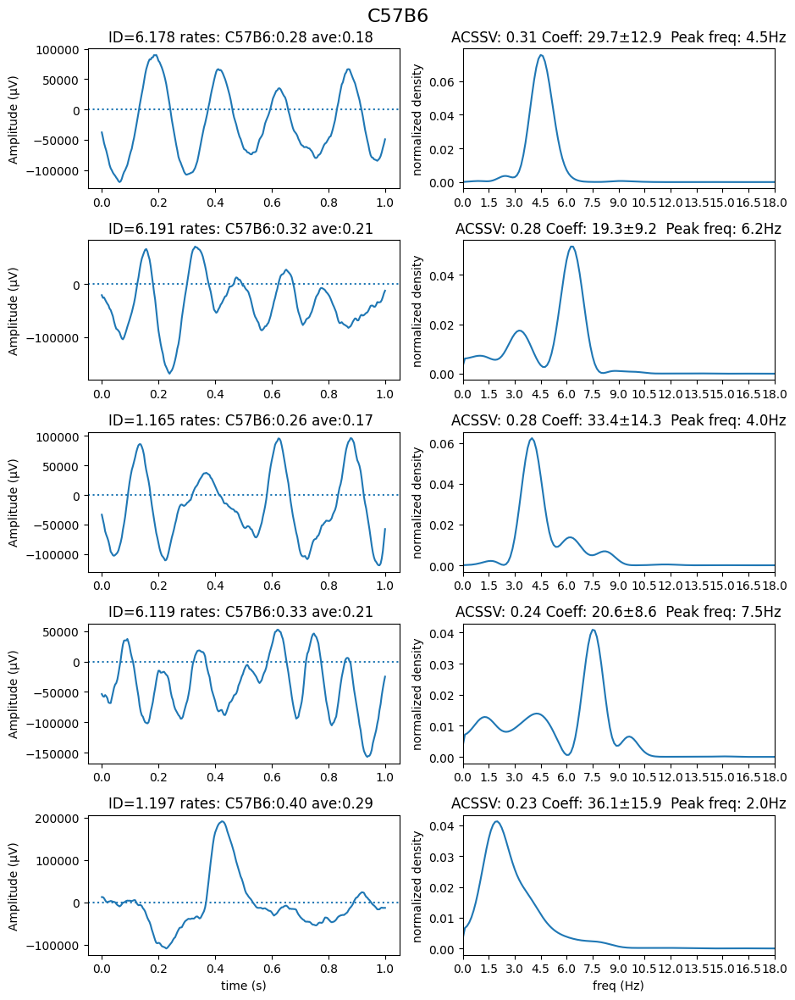

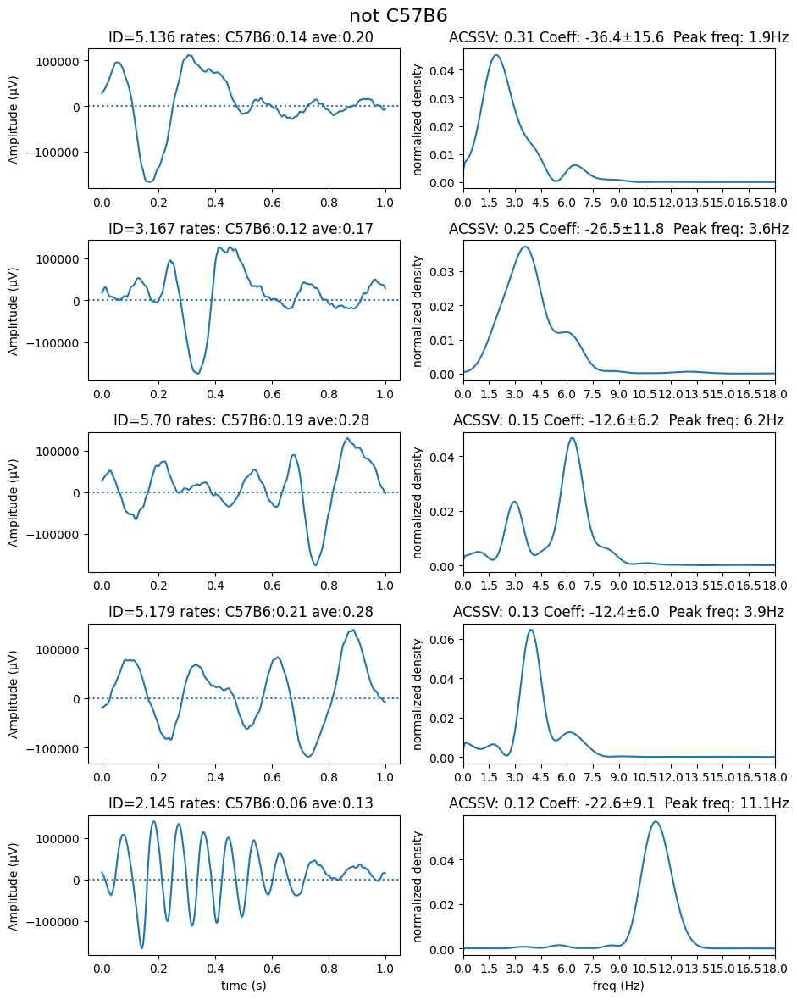

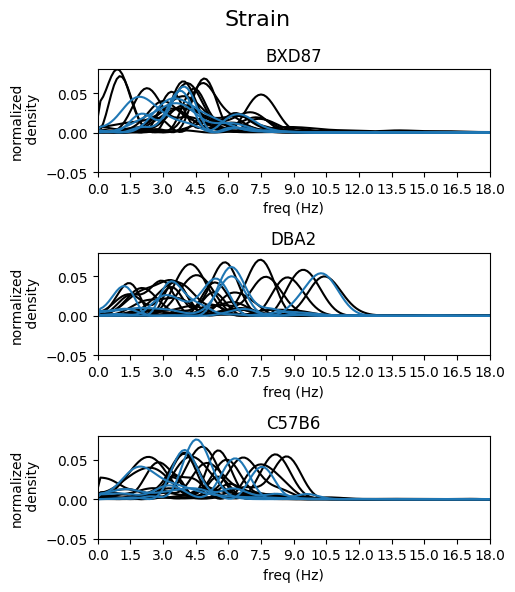

models/classifiers_l2_48001100000_512_200_256_sv_sph_svdstrainLOO


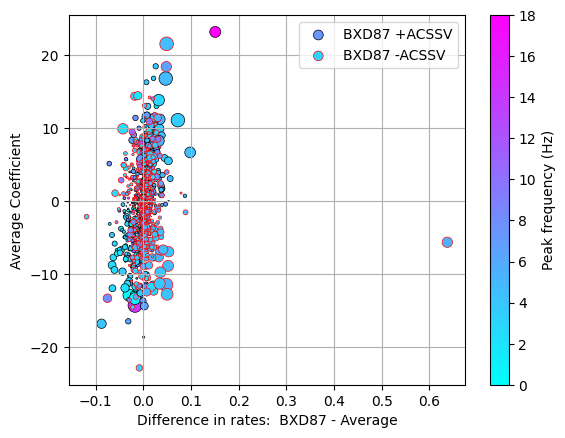

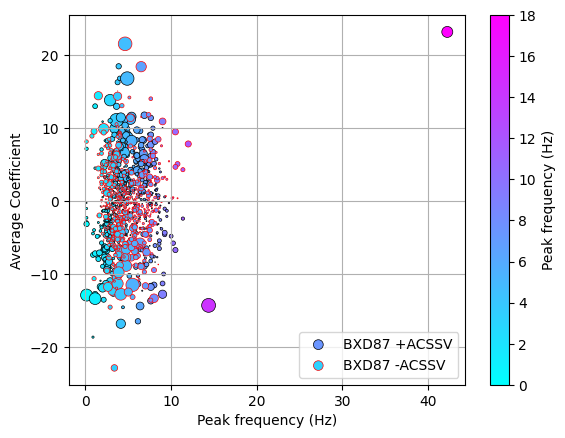

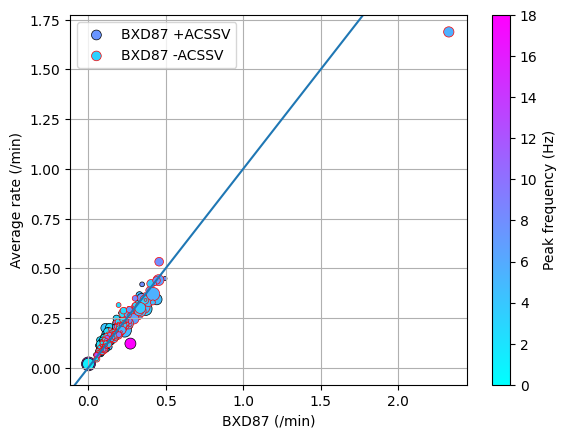

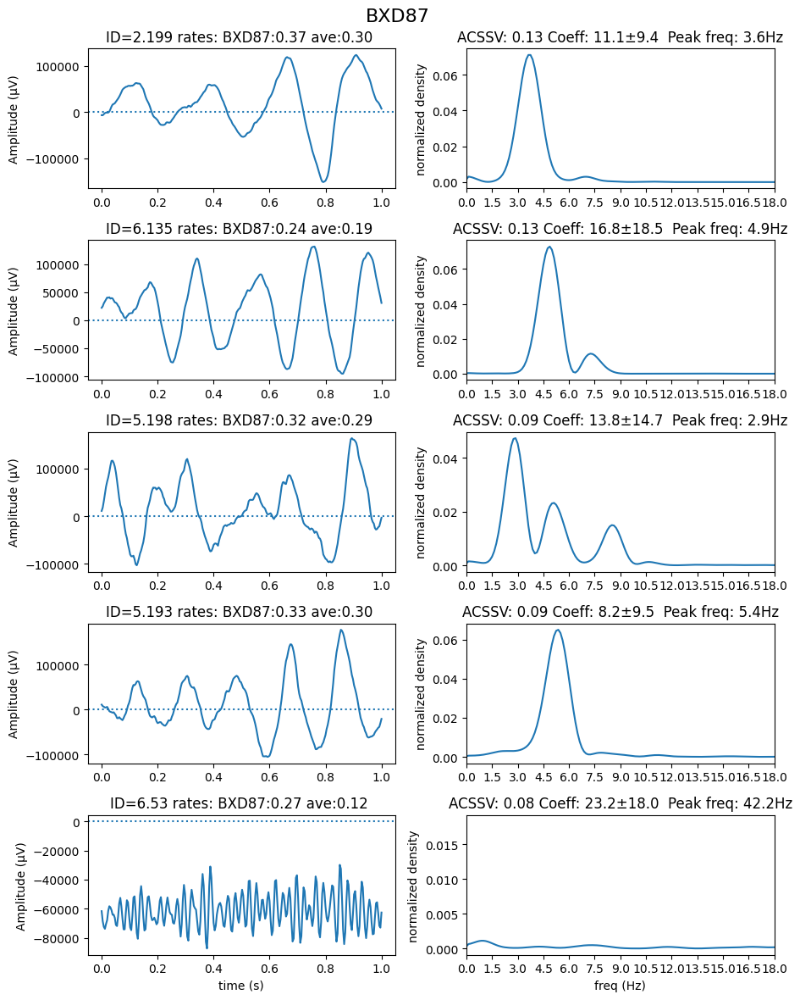

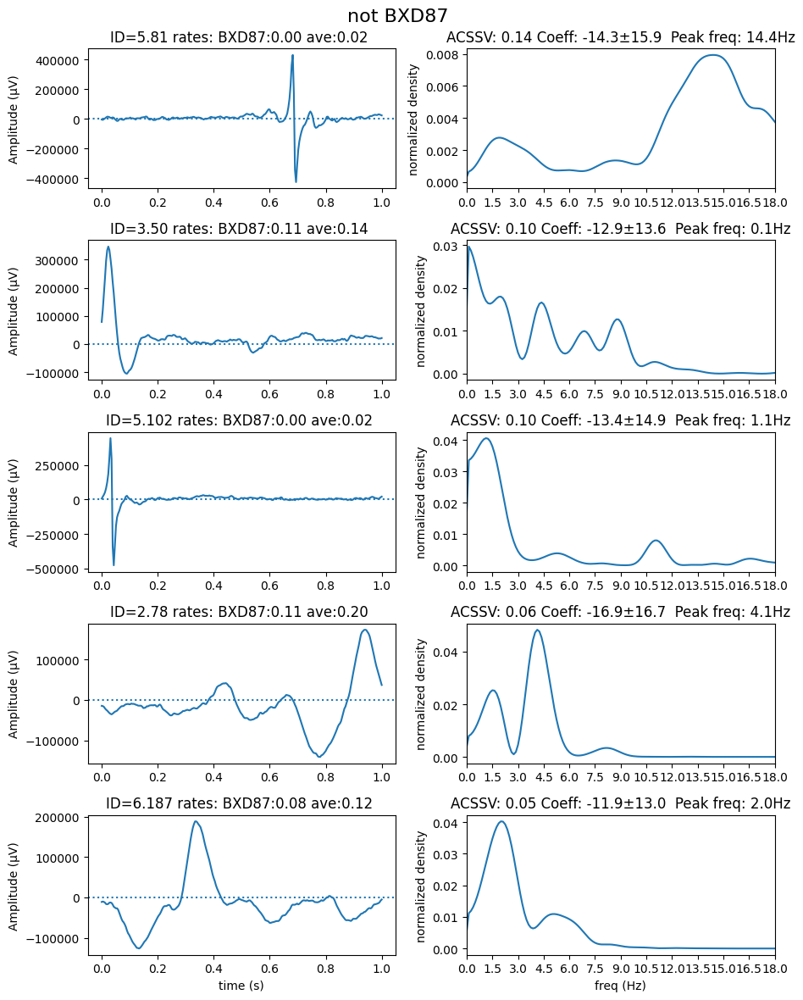

...

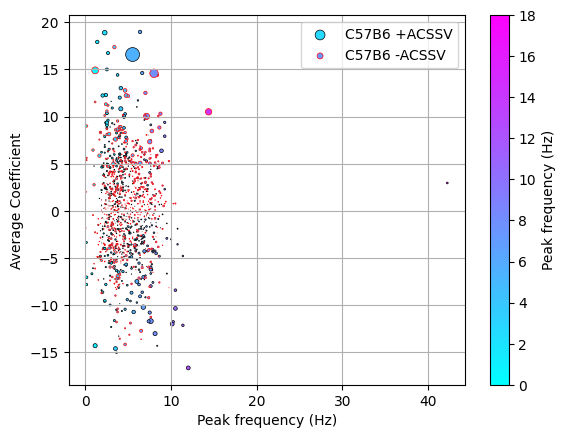

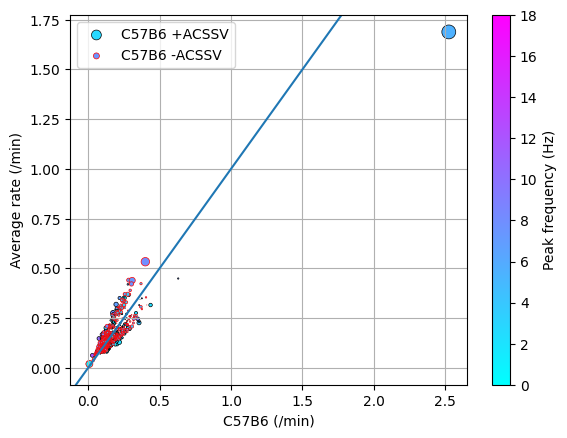

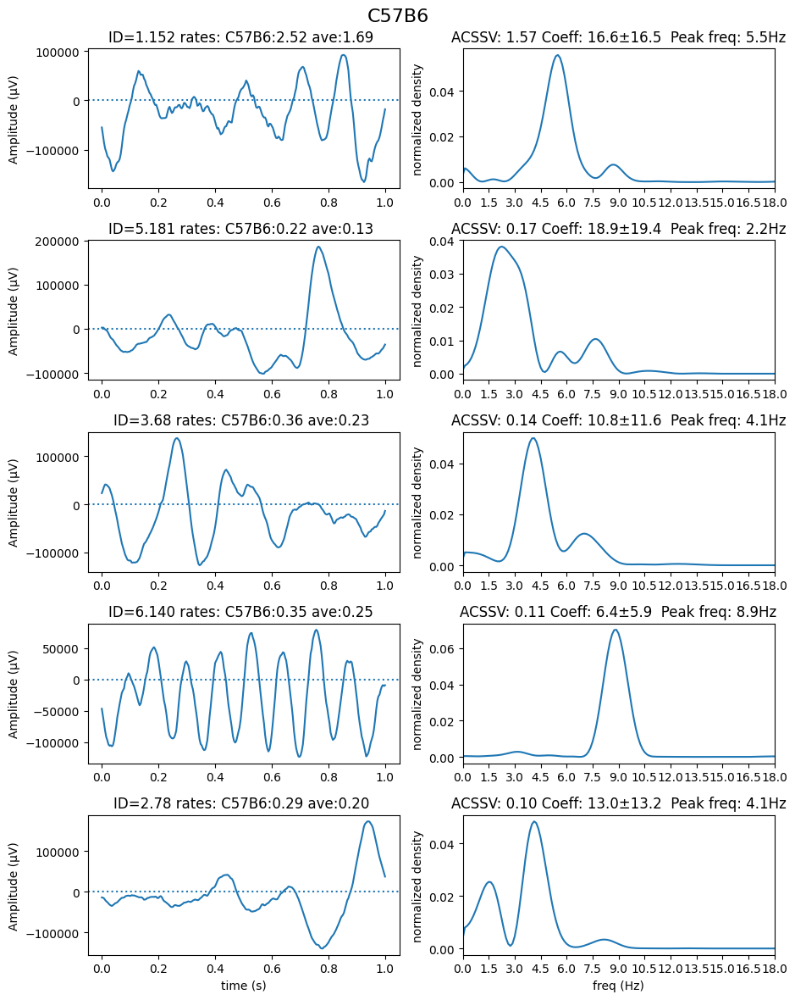

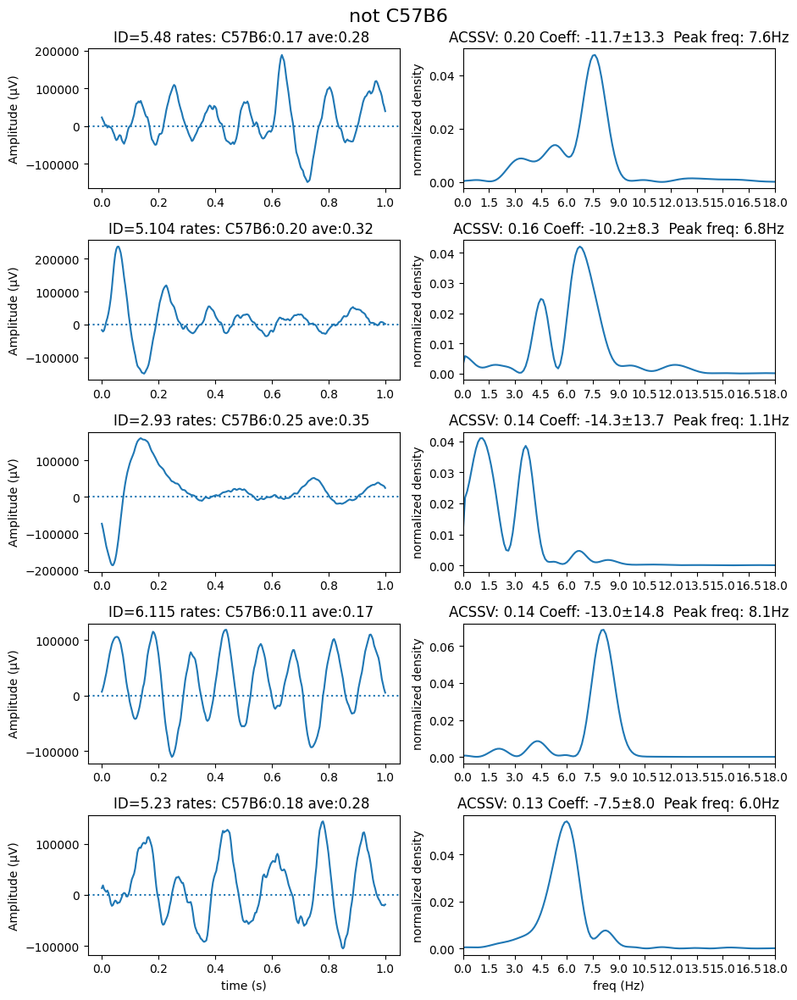

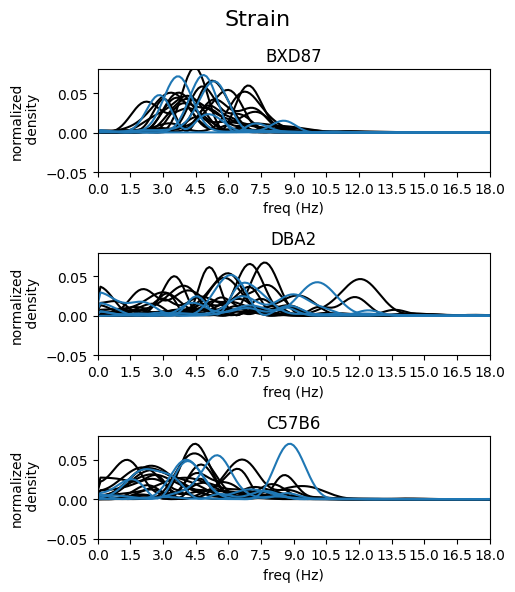

In [12]:
toplot=5

for task_str in ['strain']:#,'strain_on_tsc']:#,'tsc_on_strain']:    
    for split in range(1):#nsplits):
        for test_fold in range(nfolds):
            segment_param_string = str(n_seg)+'_'+str(split)+str(test_fold)+dict_param_string        
            segment_info_test = pickle.load(open( "data/hpc_segment_info_test_"+segment_param_string+".pickle", "rb" ) )
            segment_info_train = pickle.load(open( "data/hpc_segment_info_valid_"+segment_param_string+".pickle", "rb" ) )
            count_param_string = str(n_seg)+str(split)+str(test_fold)+dict_param_string
            
            all_counts = pickle.load(open( "data/hpc_count_valid_"+count_param_string+".pickle", "rb" ) )
            counts_test = pickle.load(open( "data/hpc_count_test_"+count_param_string+".pickle", "rb" ) )
            label_train,subject_train,subject_index2name = get_labels_subjects(segment_info_train)
            label_test, subject_test, subject_index2name_test = get_labels_subjects(segment_info_test)        

            subs_in_test, outer_indices = np.unique(subject_test,return_index=True)
            y_test_pooled = label_test[outer_indices].copy()       

            if task_str =='type':
                given_test = label_test.copy()
                classes_to_plot = np.unique(given_test)
                label_set = types
            elif task_str =='strain':
                given_test = label_test // 2
                given_train = label_train // 2
                
                classes_to_plot = np.unique(given_test)
                label_set = strains
            elif task_str =='tsc':
                given_test = label_test % 2
                classes_to_plot = np.unique(given_test)
                label_set = tscs
     
            given_test_pooled = given_test[outer_indices].copy()        
            
            results = np.zeros((y_test_pooled.shape[0],1200,6)) # Shapely 
            all_coefs = np.zeros((y_test_pooled.shape[0],1200,6)) 

            X_test = np.hstack( [ np.vstack( [counts_test[d,s] for s in segment_info_test ] ) for d in segment_info_test])    
            X_train = np.hstack( [ np.vstack( [all_counts[d,s] for s in segment_info_train ] ) for d in segment_info_train])         
            
      
            if LOO:
                n_groups = len(np.unique(subject_test))
            else:
                n_groups = 5

            group_kfold_test = StratifiedGroupKFold(n_splits=n_groups)
            # Load classifier

            filename = 'models/classifiers_l2_'+count_param_string+task_str+ 'LOO' if LOO else ''
            
            print(filename)
            pipes = pickle.load(open(filename+".pkl", "rb")) 

            for k, (train_index, test_index) in enumerate(group_kfold_test.split(X_test, label_test, subject_test)):    
#                print([(i,j) for i,j in zip(orig_label[test_index],given_test[test_index])])
                X_train_k = pipes[k].named_steps['tfidf'].transform(np.vstack((X_train, X_test[train_index])))
                X_test_k = pipes[k].named_steps['tfidf'].transform(X_test[test_index])

                test_train_groups = subject_test[train_index]
                test_groups = subject_test[test_index]                      
                
                # train_k_groups = np.concatenate((subject_train,test_groups))
                train_k_groups = np.concatenate((subject_train,test_train_groups))
                # pooling counts per mouse 
                subs_in_train, indices,inverses = np.unique(train_k_groups,return_index=True, return_inverse=True)
                X_train_k_pooled = np.zeros(X_train_k[indices].shape)#.copy()#.todense()
                for l,index in enumerate(indices):
                    X_train_k_pooled[l] = np.mean(X_train_k[inverses==l],axis=0)
                         
                subs_in_test_k, indices,inverses = np.unique(test_groups,return_index=True, return_inverse=True)
                X_test_k_pooled = np.zeros(X_test_k[indices].shape)
                for l,index in enumerate(indices):
                    X_test_k_pooled[l] = np.mean(X_test_k[inverses==l],axis=0)
                    
                explainer = shap.Explainer(pipes[k].named_steps['clf'], X_train_k_pooled)
                shap_values = explainer(X_test_k_pooled)
                results[np.isin(subs_in_test,subs_in_test_k),:,:np.max(given_test)+1] = (shap_values.values).squeeze()
                all_coefs[np.isin(subs_in_test,subs_in_test_k),:,:np.max(given_test)+1] = (pipes[k].named_steps['clf'].coef_).T[np.newaxis,:,:]

            dict_filename = "models/centroids_" + str(split) + str(test_fold) + '_' + dict_param_string + ".pickle"
            waveform_dict = pickle.load(open(dict_filename, "rb"))
            waveforms = np.vstack( [waveform_dict[d]  for d in segment_info_train])   
        
            peaks = np.zeros(waveforms.shape[0])
            nfft = 2048
            n = len(waveforms[0])
            freq,spectrum = signal.welch(waveforms[0],fs=mice_df['sfreq'].iloc[0],nfft=nfft,nperseg=int(.95*n),noverlap=int(.9*n))
        
            spectra = np.zeros((waveforms.shape[0],len(freq)))        
            for i in range(waveforms.shape[0]):
                y = waveforms[i]
                n = len(y)
                freq,spectra[i] = signal.welch(y,fs=mice_df['sfreq'].iloc[0],nfft=nfft,nperseg=int(.95*n),noverlap=int(.9*n))
                peaks[i]= freq[np.argmax(spectra[i])]
            
            nspectra = spectra/np.sum(spectra,axis=1,keepdims=True)
            weights_to_plot =[]
            spectra_to_plot = []
            names_to_plot = []
            for c in classes_to_plot:
                
                ave_occurence_rate = np.mean(np.vstack([X_train,X_test]),axis=0)/60 # per minute
                in_occurence_rate = np.mean(np.vstack([X_train[given_train==c],X_test[given_test==c]]),axis=0)/60 # per minute


                ave_shap_cont = (np.sum(results[given_test_pooled==c ,:,c],axis=0)
                                 -np.sum(results[given_test_pooled!=c ,:,c],axis=0)).squeeze()/np.sum((given_test_pooled==c)|(given_test_pooled!=c))


                ave_coef = (np.sum(all_coefs[given_test_pooled==c ,:,c],axis=0)
                 +np.sum(all_coefs[given_test_pooled!=c ,:,c],axis=0)).squeeze()/np.sum((given_test_pooled==c)|(given_test_pooled!=c))

                std_coef =np.sqrt((np.sum((all_coefs[given_test_pooled==c ,:,c]-ave_coef[np.newaxis,:])**2,axis=0)
                                 +np.sum((all_coefs[given_test_pooled!=c,:,c]-ave_coef[np.newaxis,:])**2,axis=0)
                                  ).squeeze()/(-1+np.sum((given_test_pooled==c)|(given_test_pooled!=c))))

                

                pos = ave_shap_cont>0
                neg = ave_shap_cont<0

               
                shap_size = 100*np.abs(ave_shap_cont)/np.max(np.abs(ave_shap_cont))


                fig = plt.figure()      
                plt.scatter(in_occurence_rate[pos]-ave_occurence_rate[pos], ave_coef[pos],shap_size[pos],peaks[pos],vmin=0,vmax=max_freq,edgecolors=colors_edge[(ave_shap_cont>0).astype(int)][pos],
                            label=label_set[c]+' +ACSSV',cmap='cool',lw=0.5)
                plt.scatter(in_occurence_rate[neg]-ave_occurence_rate[neg], ave_coef[neg],shap_size[neg],peaks[neg],vmin=0,vmax=max_freq,edgecolors=colors_edge[(ave_shap_cont>0).astype(int)][neg],
                            label=label_set[c]+' -ACSSV',cmap='cool',lw=0.5)
               

                plt.legend()
                plt.xlabel('Difference in rates:  {} - Average'.format(
                        label_set[c]))                          
                plt.ylabel('Average Coefficient')
                plt.grid(visible=True,which='both',axis='both')
                plt.colorbar(label='Peak frequency (Hz)')
                plt.savefig('./figures/'+'coef_'+label_set[c]+count_param_string+'.pdf')

                fig = plt.figure() 
                plt.scatter(peaks[pos], ave_coef[pos],shap_size[pos],peaks[pos],vmin=0,vmax=max_freq,edgecolors=colors_edge[(ave_shap_cont>0).astype(int)][pos],
                            label=label_set[c]+' +ACSSV',cmap='cool',lw=0.5)
                plt.scatter(peaks[neg], ave_coef[neg],shap_size[neg],peaks[neg],vmin=0,vmax=max_freq,edgecolors=colors_edge[(ave_shap_cont>0).astype(int)][neg],
                            label=label_set[c]+' -ACSSV',cmap='cool',lw=0.5)
    
                plt.legend()
                plt.grid(visible=True,which='both',axis='both')
                plt.xlabel('Peak frequency (Hz)')
                plt.ylabel('Average Coefficient')
                plt.colorbar(label='Peak frequency (Hz)')
                plt.savefig('./figures/'+'freq_'+label_set[c]+count_param_string+'.pdf')

                fig = plt.figure() 
                plt.axline((0,0),slope=1)
                plt.scatter(in_occurence_rate[pos],ave_occurence_rate[pos], 
                            shap_size[pos],peaks[pos],edgecolors=colors_edge[(ave_shap_cont>0).astype(int)][pos],vmin=0,vmax=max_freq,
                            label=label_set[c]+' +ACSSV',cmap='cool',lw=0.5)
                plt.scatter(in_occurence_rate[neg],ave_occurence_rate[neg], 
                            shap_size[neg],peaks[neg],edgecolors=colors_edge[(ave_shap_cont>0).astype(int)][neg],vmin=0,vmax=max_freq,
                            label=label_set[c]+' -ACSSV',cmap='cool',lw=0.5)
                plt.grid(visible=True,which='both',axis='both')
                plt.legend()
                plt.colorbar(label='Peak frequency (Hz)')
                plt.xlabel(label_set[c]+' (/min)')
                plt.ylabel('Average rate (/min)')
                plt.savefig('./figures/'+'rates_'+label_set[c]+count_param_string+'.pdf')

                

                for do_twice,prefix in zip([-1,1],['','not ']):
                    values = -ave_shap_cont
                    values[-do_twice*ave_coef<0] = np.inf 
                    wave_idx = np.argsort(values)

                    wave_str = ['ID={}.{} rates: {}:{:.2f} ave:{:.2f} '.format(
                        (i//200)+1,(i%200)+1,
                        label_set[c],
                        in_occurence_rate[i],
                        ave_occurence_rate[i]) for i,p in zip(wave_idx,peaks[wave_idx])]
                    peak_str = ['ACSSV: {:0.2f} Coeff: {:0.1f}±{:0.1f}  Peak freq: {:0.1f}Hz'.format(
                        ap,a,s,p) 
                                for i,ap,a,s,p in zip(wave_idx,ave_shap_cont[wave_idx],
                                                         ave_coef[wave_idx],std_coef[wave_idx],peaks[wave_idx])]
                    
                    fig,axs=plot_codebooks(waveforms[wave_idx[:toplot]],nspectra[wave_idx[:toplot]],freq,prefix+label_set[c],titles=(wave_str,peak_str),ncols=1)
                    fig.savefig('./figures/'+'waves_'+prefix+label_set[c]+count_param_string+'.pdf')
                    if do_twice==1: 
                        continue
                    names_to_plot.append(prefix+label_set[c])
                    spectra_to_plot.append(nspectra[wave_idx[:n_spectra]])                   
                    weights_to_plot.append(8*np.abs(ave_shap_cont[wave_idx[:n_spectra]]))#ave_shap_cont            

            fig,ax = plot_spectra(weights_to_plot,spectra_to_plot,freq,names_to_plot,title='Strain',figsize=(5.25, 6),ylims=[-0.05,0.08])
            fig.savefig('./figures/'+'spectra_'+'strain_'+count_param_string+'.pdf')
